In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch
from scipy import signal
from scipy.signal import hilbert
from matplotlib import colors as mcolors


sys.path.insert(0, r"/Users/novak/Documents/UTSW/erfan/deeplagfield/StocasticDiffEq_Simulation")

from NeuralFieldManifold.models import AR
from NeuralFieldManifold.embedders import embed
from NeuralFieldManifold.pub_utils import set_pub_style, prettify
set_pub_style()

In [2]:
signal_path = r"/Users/novak/Documents/UTSW/erfan/deeplagfield/eeg_signal_sec3.npy"
time_path   = r"/Users/novak/Documents/UTSW/erfan/deeplagfield/eeg_time_sec3.npy"
label_path  = r"/Users/novak/Documents/UTSW/erfan/deeplagfield/state_sec3.npy"

eeg = np.load(signal_path)
time = np.load(time_path)
labels = np.load(label_path)

fs = 400

print(f"EEG shape: {eeg.shape}, fs: {fs:.1f} Hz")
print(f"Time shape: {time.shape}")
print(f"Labels shape: {labels.shape}")
print(f"Unique labels: {np.unique(labels)}")
print(f"Duration: {len(eeg)/fs:.1f} sec")

EEG shape: (1440000,), fs: 400.0 Hz
Time shape: (1440000,)
Labels shape: (1800,)
Unique labels: [0 1 2]
Duration: 3600.0 sec


In [3]:
def load_eeg_data(time_path, signal_path):
    """Load EEG data from numpy files."""
    time = np.load(time_path)
    signal_data = np.load(signal_path)
    fs = 1 / np.mean(np.diff(time))
    return time, signal_data, fs

def bandpass_filter(x, Fs, low, high, order=4):
    wn = [low/(Fs/2), high/(Fs/2)]
    sos = signal.butter(order, wn, btype='bandpass', output='sos')
    return signal.sosfiltfilt(sos, x)

def envelope_normalize(x, fs, fband=(15, 30), env_lp_hz=5.0, eps=1e-6):
    b, a = signal.butter(4, np.array(fband)/(fs/2), btype='bandpass')
    x_bp = signal.filtfilt(b, a, x)
    z = hilbert(x_bp)
    A = np.abs(z)
    if env_lp_hz is not None:
        b_lp, a_lp = signal.butter(2, env_lp_hz/(fs/2), btype='low')
        A = signal.filtfilt(b_lp, a_lp, A)
    x_flat = x_bp / (A + eps)
    x_flat *= np.median(A)
    return x_flat, x_bp, A

def process_eeg_signal(raw_signal, Fs, 
                       notch_freq=60, notch_Q=30,
                       bandpass_low=0.5, bandpass_high=40,
                       fband=(1, 40), env_lp_hz=3.0):
    """Process EEG signal with notch filter, bandpass, and envelope normalization."""
    filtered = signal.filtfilt(*signal.iirnotch(notch_freq, notch_Q, Fs), raw_signal)
    x = np.asarray(filtered).ravel()
    xs_raw = bandpass_filter(x, Fs, low=bandpass_low, high=bandpass_high)
    xs, _, _ = envelope_normalize(xs_raw, Fs, fband=fband, env_lp_hz=env_lp_hz)
    return xs, xs_raw

In [4]:
preprocessed, xs_raw = process_eeg_signal(eeg, fs)

win_samples = int(2 * fs)
n_windows = len(labels)

eeg_windows = preprocessed.reshape(n_windows, win_samples)

# Band power features (baseline decoder)
bands = {
    'delta': (0.5, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta':  (13, 30),
}

band_power = np.zeros((n_windows, len(bands)))

for i in range(n_windows):
    freqs, psd = welch(eeg_windows[i], fs=fs, nperseg=min(512, win_samples), noverlap=256)
    for j, (band_name, (flo, fhi)) in enumerate(bands.items()):
        idx = (freqs >= flo) & (freqs <= fhi)
        band_power[i, j] = np.trapezoid(psd[idx], freqs[idx])
band_power_log = np.log10(band_power + 1e-12)


In [5]:
tau = 1
dim = 3

feature_list = []

for i in range(n_windows):
    X3 = embed(eeg_windows[i], dim, tau)
    
    mu = X3.mean(axis=0)          # 3 features
    sd = X3.std(axis=0)           # 3 features  
    
    cov = np.cov(X3.T)
    triu_idx = np.triu_indices(dim)
    cov_feat = cov[triu_idx]      # 6 features
    
    feature_list.append(np.concatenate([mu, sd, cov_feat]))

embed_features_rich = np.array(feature_list)

In [6]:
### LDA on mean, std, and covariance features 
from sklearn.utils import resample
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

np.random.seed(42)
min_count = min(np.sum(labels == 0), np.sum(labels == 1), np.sum(labels == 2))
print(f"Balancing to {min_count} samples per class")

idx_balanced = []
for state in [0, 1, 2]:
    state_idx = np.where(labels == state)[0]
    chosen = resample(state_idx, n_samples=min_count, replace=False, random_state=42)
    idx_balanced.extend(chosen)

idx_balanced = np.array(idx_balanced)
np.random.shuffle(idx_balanced)

labels_bal = labels[idx_balanced]
band_bal = band_power_log[idx_balanced]
embed_bal = embed_features_rich[idx_balanced]

print(f"Balanced dataset: {len(labels_bal)} samples")
for v in [0, 1, 2]:
    print(f"  Class {v}: {np.sum(labels_bal == v)}")


lda = LinearDiscriminantAnalysis()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

pred_band_bal = cross_val_predict(lda, band_bal, labels_bal, cv=cv)
pred_embed_bal = cross_val_predict(lda, embed_bal, labels_bal, cv=cv)

acc_band_bal = accuracy_score(labels_bal, pred_band_bal)
acc_embed_bal = accuracy_score(labels_bal, pred_embed_bal)


Balancing to 109 samples per class
Balanced dataset: 327 samples
  Class 0: 109
  Class 1: 109
  Class 2: 109


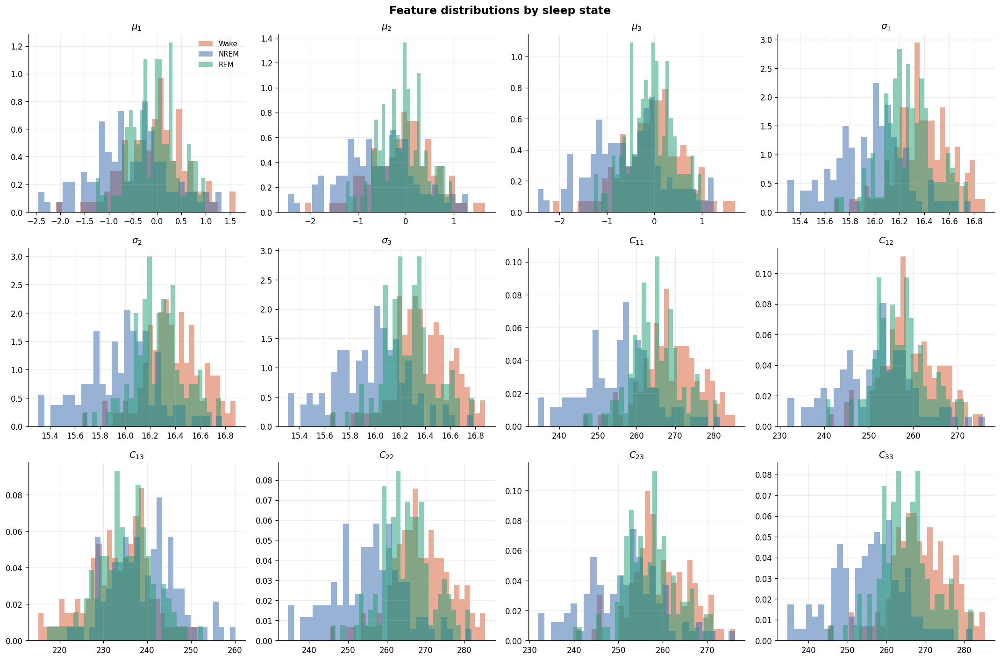

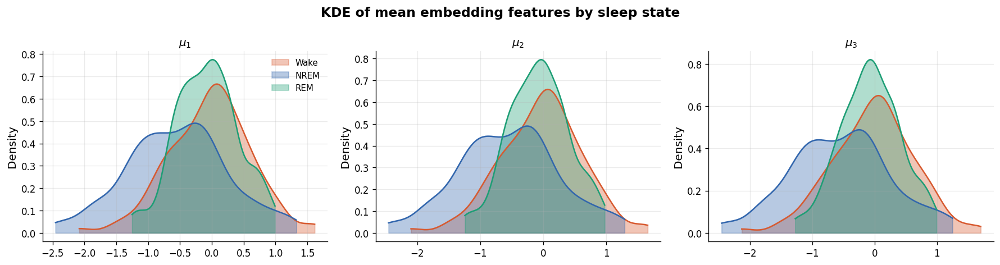

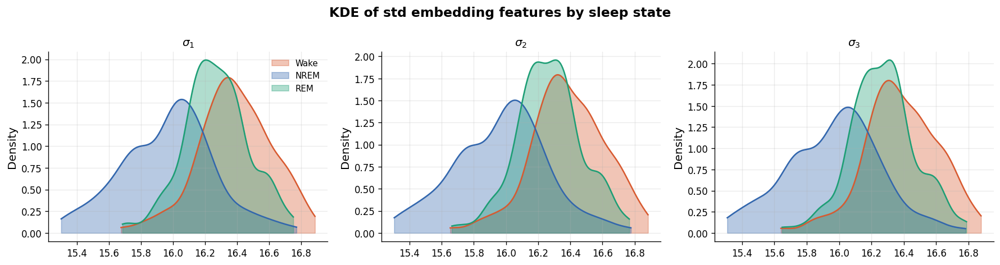

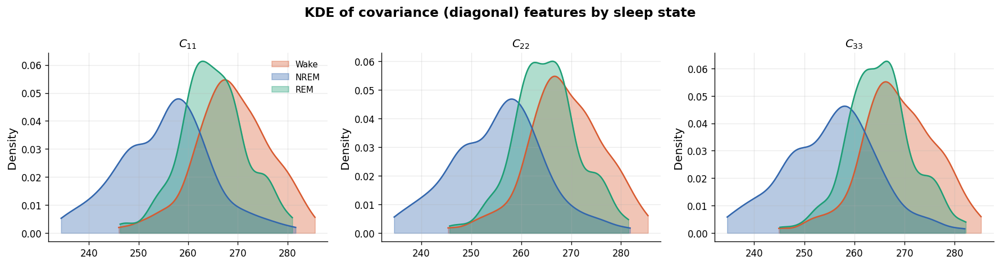

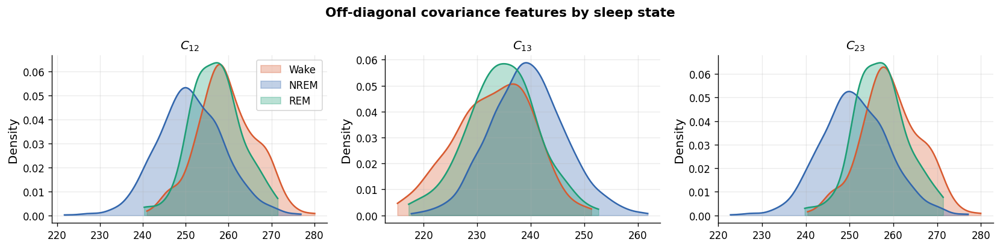

In [7]:

# ── Histograms of embedding features by sleep state ──
state_names = ['Wake', 'NREM', 'REM']
colors_list = ['#D85A30', '#3266ad', '#1D9E75']

feat_bal = embed_features_rich[idx_balanced]
lab_bal  = labels[idx_balanced]

feat_names = [
    r'$\mu_1$', r'$\mu_2$', r'$\mu_3$',
    r'$\sigma_1$', r'$\sigma_2$', r'$\sigma_3$',
    r'$C_{11}$', r'$C_{12}$', r'$C_{13}$',
    r'$C_{22}$', r'$C_{23}$', r'$C_{33}$',
]

fig, axes = plt.subplots(3, 4, figsize=(18, 12), sharey=False)
axes = axes.ravel()

for j in range(12):
    ax = axes[j]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        ax.hist(feat_bal[lab_bal == s, j], bins=30, alpha=0.5,
                color=color, label=name, density=True)
    ax.set_title(feat_names[j], fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if j == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('Feature distributions by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── KDE for mean features ──
from scipy.stats import gaussian_kde

mean_idx = [0, 1, 2]  # mu_1, mu_2, mu_3
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for k, j in enumerate(mean_idx):
    ax = axes[k]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        vals = feat_bal[lab_bal == s, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.35, color=color, label=name)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(feat_names[j], fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('KDE of mean embedding features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── KDE for std features ──
std_idx = [3, 4, 5]  # sigma_1, sigma_2, sigma_3
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for k, j in enumerate(std_idx):
    ax = axes[k]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        vals = feat_bal[lab_bal == s, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.35, color=color, label=name)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(feat_names[j], fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('KDE of std embedding features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── KDE for covariance diagonal features ──
cov_idx = [6, 9, 11]  # C_11, C_22, C_33
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for k, j in enumerate(cov_idx):
    ax = axes[k]
    for s, name, color in zip([0, 1, 2], state_names, colors_list):
        vals = feat_bal[lab_bal == s, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.35, color=color, label=name)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(feat_names[j], fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)

fig.suptitle('KDE of covariance (diagonal) features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Off-diagonal covariance features: C12, C13, C23
# These are indices 1, 2, 4 in the upper triangle (after mean and std)
# In embed_features_rich: [mu1,mu2,mu3, sd1,sd2,sd3, C11,C12,C13,C22,C23,C33]
#                          0    1   2    3   4   5    6   7   8   9   10  11

fig, axes = plt.subplots(1, 3, figsize=(14, 3.5))
offdiag_names = [r'$C_{12}$', r'$C_{13}$', r'$C_{23}$']
offdiag_idx = [7, 8, 10]

for ax, feat_idx, name in zip(axes, offdiag_idx, offdiag_names):
    for state, sname, color in zip([0,1,2], state_names, colors_list):
        mask = labels == state
        vals = embed_features_rich[mask, feat_idx]
        from scipy.stats import gaussian_kde
        kde = gaussian_kde(vals)
        x = np.linspace(vals.min(), vals.max(), 200)
        ax.fill_between(x, kde(x), alpha=0.3, color=color, label=sname)
        ax.plot(x, kde(x), color=color, lw=1.5)
    ax.set_title(name, fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if ax == axes[0]:
        ax.legend()

plt.suptitle('Off-diagonal covariance features by sleep state', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# Torus-based decoding
Fit an elliptical torus to each lag-embedded window and use the geometric parameters (R1, R2, r, MSE, mean error, fraction inside) as features for sleep-state classification.

In [8]:
from scipy import optimize

def fit_elliptical_torus_3d(points, lam=1.0, lam_h=0.5, n_modes=3):
    """
    Fit an *elliptical* torus to a 3D point cloud.
    Returns dict with: center, direction, u_axis, v_axis,
    R1, R2, minor_radius, mse, mean_error, frac_inside, pc_extents.
    """
    pts = np.asarray(points, dtype=np.float64)
    N = len(pts)

    center0 = pts.mean(axis=0)
    centered = pts - center0
    U, S, Vt = np.linalg.svd(centered, full_matrices=False)
    pc_extents = 2.0 * S / np.sqrt(N)

    r_target  = pc_extents[2] / 2.0
    R1_target = max(pc_extents[0] / 2.0 - r_target, r_target)
    R2_target = max(pc_extents[1] / 2.0 - r_target, r_target)

    u0, v0, n0 = Vt[0], Vt[1], Vt[2]

    def _build_frame(dn):
        R1   = np.linalg.norm(dn) + 1e-12
        n_ax = dn / R1
        u_cand = u0 - np.dot(u0, n_ax) * n_ax
        u_ax   = u_cand / (np.linalg.norm(u_cand) + 1e-12)
        v_ax   = np.cross(n_ax, u_ax)
        v_ax   = v_ax / (np.linalg.norm(v_ax) + 1e-12)
        return R1, n_ax, u_ax, v_ax

    def _ellipse_torus_distance(center, n_ax, u_ax, v_ax, R1, R2, pts):
        dp = pts - center
        along_n = (dp @ n_ax)[:, None] * n_ax
        perp = dp - along_n
        cu = perp @ u_ax
        cv = perp @ v_ax
        phi = np.arctan2(cv / (R2 + 1e-12), cu / (R1 + 1e-12))
        ex = R1 * np.cos(phi)
        ey = R2 * np.sin(phi)
        nearest = ex[:, None] * u_ax + ey[:, None] * v_ax + center
        return np.linalg.norm(pts - nearest, axis=1), phi

    def residuals(params):
        c  = params[:3]
        dn = params[3:6]
        R1, n_ax, u_ax, v_ax = _build_frame(dn)
        R2 = R1 * np.exp(params[6])
        r  = np.exp(params[7])

        d, phi = _ellipse_torus_distance(c, n_ax, u_ax, v_ax, R1, R2, pts)
        surface_resid = d - r

        w = lam * np.sqrt(N)
        reg = np.array([
            w * (2.0 * (R1 + r) - pc_extents[0]) / (pc_extents[0] + 1e-12),
            w * (2.0 * (R2 + r) - pc_extents[1]) / (pc_extents[1] + 1e-12),
            w * (2.0 * r         - pc_extents[2]) / (pc_extents[2] + 1e-12),
        ])

        homog = []
        for k in range(1, n_modes + 1):
            homog.append(lam_h * np.sqrt(N) * np.mean(surface_resid * np.cos(k * phi)))
            homog.append(lam_h * np.sqrt(N) * np.mean(surface_resid * np.sin(k * phi)))
        homog = np.array(homog)

        return np.concatenate([surface_resid, reg, homog])

    ratio0 = np.clip(R2_target / (R1_target + 1e-12), 0.1, 1.0)
    x0 = np.concatenate([
        center0, n0 * R1_target,
        [np.log(ratio0)], [np.log(max(r_target, 1e-3))],
    ])

    lb = np.full_like(x0, -np.inf)
    ub = np.full_like(x0,  np.inf)
    max_R1 = pc_extents[0] / 2.0
    lb[3:6] = -max_R1
    ub[3:6] =  max_R1
    ratio_cap = np.clip(pc_extents[1] / (pc_extents[0] + 1e-12), 0.05, 1.0)
    lb[6] = np.log(0.05)
    ub[6] = np.log(ratio_cap)
    lb[7] = np.log(1e-3)
    ub[7] = np.log(pc_extents[2] / 2.0 + 1e-6)

    x0 = np.clip(x0, lb, ub)

    result = optimize.least_squares(
        residuals, x0, bounds=(lb, ub),
        loss='huber', f_scale=1.0, max_nfev=4000,
    )

    c  = result.x[:3]
    dn = result.x[3:6]
    R1, n_ax, u_ax, v_ax = _build_frame(dn)
    R2 = R1 * np.exp(result.x[6])
    r  = np.exp(result.x[7])

    if abs(np.dot(u_ax, u0)) < abs(np.dot(v_ax, u0)):
        R1, R2 = R2, R1
        u_ax, v_ax = v_ax, u_ax

    d, _ = _ellipse_torus_distance(c, n_ax, u_ax, v_ax, R1, R2, pts)
    signed = d - r
    outside_dist = np.maximum(0.0, signed)
    inside_mask = signed <= 0

    return dict(
        center=c, direction=n_ax, u_axis=u_ax, v_axis=v_ax,
        R1=float(R1), R2=float(R2), minor_radius=float(r),
        mse=float(np.mean(outside_dist ** 2)),
        mean_error=float(np.mean(outside_dist)),
        frac_inside=float(inside_mask.sum() / N),
        pc_extents=pc_extents,
    )

print("fit_elliptical_torus_3d defined.")

fit_elliptical_torus_3d defined.


In [9]:
from joblib import Parallel, delayed

tau_torus = 1
dim_torus = 3
torus_keys = ['R1', 'R2', 'minor_radius', 'mse', 'mean_error', 'frac_inside']

# Pre-embed all windows (fast via JAX)
embedded_windows = [np.asarray(embed(eeg_windows[i], dim_torus, tau_torus))
                    for i in range(n_windows)]

def _safe_fit(pts, lam=1.0, lam_h=0.5):
    """Fit torus with fallback on failure."""
    try:
        return fit_elliptical_torus_3d(pts, lam=lam, lam_h=lam_h)
    except Exception:
        return None

def sweep_fits(windows, lam=1.0, lam_h=0.5, n_jobs=-1):
    """Parallel torus fitting over a list of point clouds."""
    fits = Parallel(n_jobs=n_jobs, verbose=5)(
        delayed(_safe_fit)(w, lam=lam, lam_h=lam_h)
        for w in windows
    )
    return fits

print(f"Fitting torus to {n_windows} windows in parallel...")
fits = sweep_fits(embedded_windows)

# Collect into feature array
torus_features = np.full((n_windows, len(torus_keys)), np.nan)
for i, f in enumerate(fits):
    if f is not None:
        for j, k in enumerate(torus_keys):
            torus_features[i, j] = f[k]

# Impute failed fits with column medians
nan_mask = np.isnan(torus_features).any(axis=1)
if nan_mask.sum() > 0:
    col_median = np.nanmedian(torus_features, axis=0)
    torus_features[nan_mask] = col_median
    print(f"Imputed {nan_mask.sum()} failed windows with column medians.")

print(f"Torus features shape: {torus_features.shape}")
print(f"Feature names: {torus_keys}")
print(f"Example (window 0): {dict(zip(torus_keys, torus_features[0]))}")

Fitting torus to 1800 windows in parallel...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 260 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 422 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 620 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 854 tasks      | elapsed:   37.4s
[Parallel(n_jobs=-1)]: Done 1124 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done 1430 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 1772 tasks      | elapsed:  1.3min


Torus features shape: (1800, 6)
Feature names: ['R1', 'R2', 'minor_radius', 'mse', 'mean_error', 'frac_inside']
Example (window 0): {'R1': np.float64(33.64813948792251), 'R2': np.float64(4.018273596606242), 'minor_radius': np.float64(0.2837732820688036), 'mse': np.float64(141.38445131807615), 'mean_error': np.float64(9.002929844658508), 'frac_inside': np.float64(0.018796992481203006)}


[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.4min finished


In [10]:
# Decode sleep state from torus features (balanced classes)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

torus_bal = torus_features[idx_balanced]

lda = LinearDiscriminantAnalysis()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

pred_torus_bal = cross_val_predict(lda, torus_bal, labels_bal, cv=cv)
acc_torus_bal = accuracy_score(labels_bal, pred_torus_bal)

# Also try combined: torus + lag-embedding stats
combined_bal = np.hstack([embed_bal, torus_bal])
pred_combined_bal = cross_val_predict(lda, combined_bal, labels_bal, cv=cv)
acc_combined_bal = accuracy_score(labels_bal, pred_combined_bal)

print(f"Band power:            acc={acc_band_bal:.3f}")
print(f"Lag embedding (stats): acc={acc_embed_bal:.3f}")
print(f"Torus geometry:        acc={acc_torus_bal:.3f}")
print(f"Torus + embedding:     acc={acc_combined_bal:.3f}")
print(f"\nTorus geometry report:")
print(classification_report(labels_bal, pred_torus_bal, target_names=['Wake','NREM','REM']))
print(f"Torus + embedding report:")
print(classification_report(labels_bal, pred_combined_bal, target_names=['Wake','NREM','REM']))

Band power:            acc=0.599
Lag embedding (stats): acc=0.716
Torus geometry:        acc=0.725
Torus + embedding:     acc=0.725

Torus geometry report:
              precision    recall  f1-score   support

        Wake       0.64      0.63      0.64       109
        NREM       0.89      0.94      0.92       109
         REM       0.62      0.60      0.61       109

    accuracy                           0.72       327
   macro avg       0.72      0.72      0.72       327
weighted avg       0.72      0.72      0.72       327

Torus + embedding report:
              precision    recall  f1-score   support

        Wake       0.66      0.58      0.61       109
        NREM       0.93      0.91      0.92       109
         REM       0.60      0.69      0.64       109

    accuracy                           0.72       327
   macro avg       0.73      0.72      0.73       327
weighted avg       0.73      0.72      0.73       327



In [11]:
# ── Decode with RADII only: R1, R2, minor_radius ──
radii_keys = ['R1', 'R2', 'minor_radius']
radii_idx = [torus_keys.index(k) for k in radii_keys]
radii_features = torus_features[:, radii_idx]
radii_bal = radii_features[idx_balanced]

lda_radii = LinearDiscriminantAnalysis()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
pred_radii_bal = cross_val_predict(lda_radii, radii_bal, labels_bal, cv=cv)
acc_radii_bal = accuracy_score(labels_bal, pred_radii_bal)

print(f"Radii only (R1, R2, r):  acc={acc_radii_bal:.3f}")
print(f"\nRadii-only report:")
print(classification_report(labels_bal, pred_radii_bal, target_names=['Wake','NREM','REM']))

Radii only (R1, R2, r):  acc=0.731

Radii-only report:
              precision    recall  f1-score   support

        Wake       0.67      0.68      0.67       109
        NREM       0.87      0.92      0.89       109
         REM       0.64      0.60      0.62       109

    accuracy                           0.73       327
   macro avg       0.73      0.73      0.73       327
weighted avg       0.73      0.73      0.73       327



In [12]:
# ── Decode with ORIENTATION only: direction, u_axis, v_axis ──
# Extract 9-dim orientation vectors from each fit (3 axes × 3 components)
orient_features = np.full((n_windows, 9), np.nan)
for i, f in enumerate(fits):
    if f is not None:
        orient_features[i, 0:3] = f['direction']
        orient_features[i, 3:6] = f['u_axis']
        orient_features[i, 6:9] = f['v_axis']

# Impute failed fits with column medians
nan_mask_o = np.isnan(orient_features).any(axis=1)
if nan_mask_o.sum() > 0:
    col_median_o = np.nanmedian(orient_features, axis=0)
    orient_features[nan_mask_o] = col_median_o

orient_bal = orient_features[idx_balanced]

lda_orient = LinearDiscriminantAnalysis()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
pred_orient_bal = cross_val_predict(lda_orient, orient_bal, labels_bal, cv=cv)
acc_orient_bal = accuracy_score(labels_bal, pred_orient_bal)

print(f"Orientation (dir, u, v): acc={acc_orient_bal:.3f}")
print(f"\nOrientation-only report:")
print(classification_report(labels_bal, pred_orient_bal, target_names=['Wake','NREM','REM']))

Orientation (dir, u, v): acc=0.379

Orientation-only report:
              precision    recall  f1-score   support

        Wake       0.36      0.36      0.36       109
        NREM       0.35      0.32      0.33       109
         REM       0.43      0.46      0.44       109

    accuracy                           0.38       327
   macro avg       0.38      0.38      0.38       327
weighted avg       0.38      0.38      0.38       327



## Feature-set summary

| Feature set | # features | Contents |
|---|---|---|
| **Band power** | 4 | log band power in δ, θ, α, β |
| **Lag embed** | 12 | mean (3) + std (3) + upper-tri covariance (6) of 3D embedding |
| **Radii** | 3 | $R_1$, $R_2$, minor radius $r$ |
| **Orientation** | 9 | direction $\hat{n}$ (3) + major axis $\hat{u}$ (3) + minor axis $\hat{v}$ (3) |
| **Torus (6 feat)** | 6 | Radii (3) + fit quality: MSE, mean error, frac inside |
| **All torus (15 feat)** | 15 | Torus 6 + Orientation 9 — all torus parameters flattened |
| **Torus + embed** | 18 | Torus 6 + Lag embed 12 — geometry + embedding statistics |

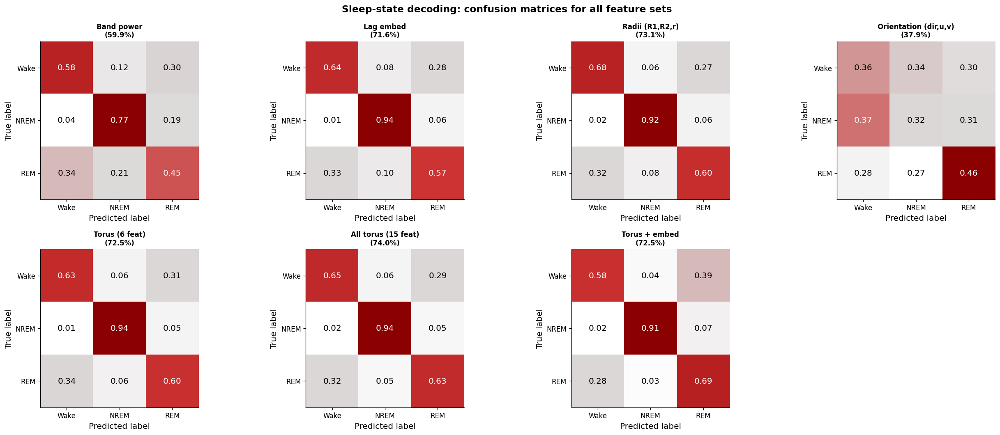

In [13]:
# ── Decode with ALL torus parameters flattened + confusion matrices ──
all_torus_features = np.hstack([torus_features, orient_features])
all_torus_bal = all_torus_features[idx_balanced]

lda_all = LinearDiscriminantAnalysis()
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
pred_all_bal = cross_val_predict(lda_all, all_torus_bal, labels_bal, cv=cv)
acc_all_bal = accuracy_score(labels_bal, pred_all_bal)

# --- Confusion matrices for ALL 7 feature sets ---
cmap_cm = mcolors.LinearSegmentedColormap.from_list(
    "white_darkred",
    [(0.0, "#ffffff"), (0.35, "#aca3a36c"),
     (0.60, "#c10404cf"), (1.0, "#8b0000ff")]
)

all_preds = [
    pred_band_bal, pred_embed_bal, pred_radii_bal, pred_orient_bal,
    pred_torus_bal, pred_all_bal, pred_combined_bal,
]
all_titles = [
    f'Band power\n({acc_band_bal:.1%})',
    f'Lag embed\n({acc_embed_bal:.1%})',
    f'Radii (R1,R2,r)\n({acc_radii_bal:.1%})',
    f'Orientation (dir,u,v)\n({acc_orient_bal:.1%})',
    f'Torus (6 feat)\n({acc_torus_bal:.1%})',
    f'All torus (15 feat)\n({acc_all_bal:.1%})',
    f'Torus + embed\n({acc_combined_bal:.1%})',
]

fig, axes = plt.subplots(2, 4, figsize=(22, 9))
axes_flat = axes.ravel()

for i, (pred, title) in enumerate(zip(all_preds, all_titles)):
    ax = axes_flat[i]
    cm = confusion_matrix(labels_bal, pred, normalize='true')
    disp = ConfusionMatrixDisplay(cm, display_labels=state_names)
    disp.plot(ax=ax, cmap=cmap_cm, values_format='.2f', colorbar=False)
    for txt in disp.text_.ravel():
        r_, g_, b_, _ = mcolors.to_rgba(txt.get_color())
        if not (r_ > 0.95 and g_ > 0.95 and b_ > 0.95):
            txt.set_color('black')
    ax.set_title(title, fontweight='bold', fontsize=10)
    ax.grid(False)

# Hide the unused 8th subplot
axes_flat[7].set_visible(False)

fig.suptitle('Sleep-state decoding: confusion matrices for all feature sets',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

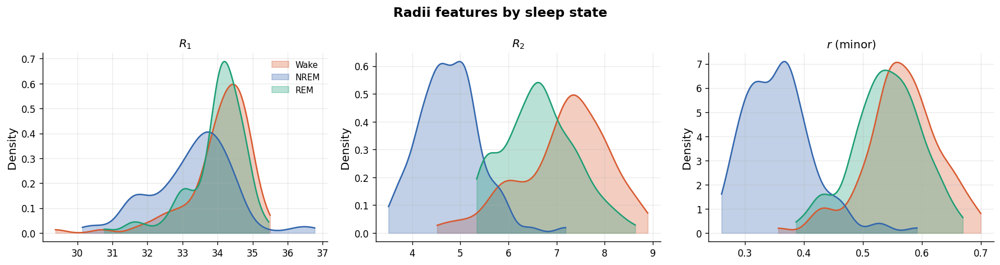

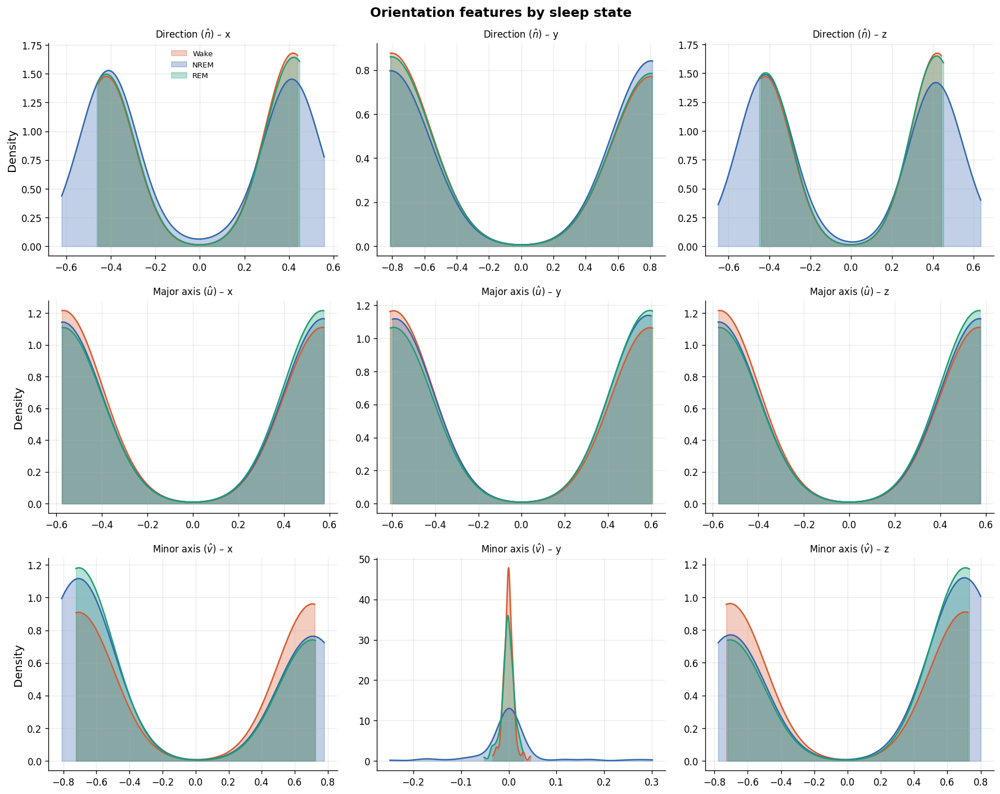

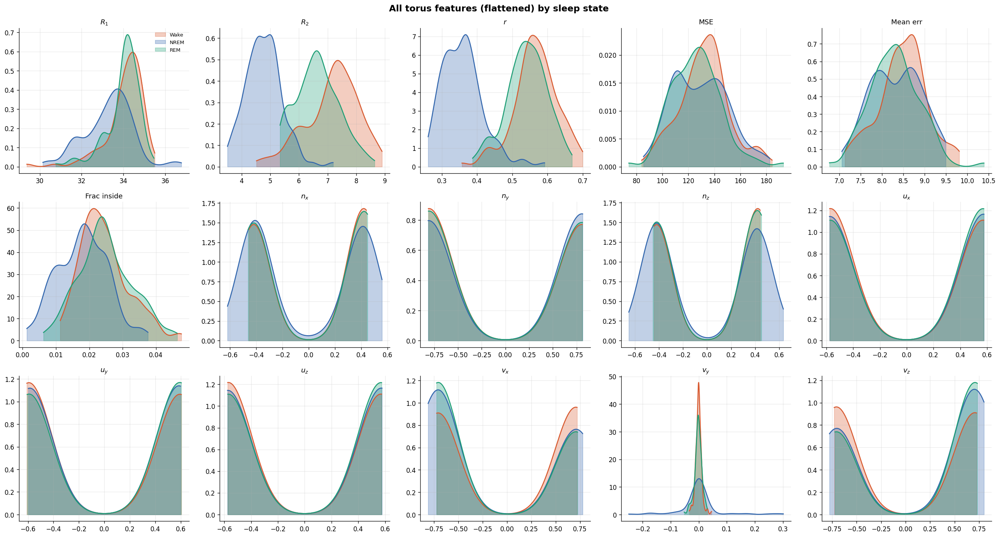

In [14]:
# ── Feature distributions by sleep state ──
from scipy.stats import gaussian_kde

state_names = ['Wake', 'NREM', 'REM']
colors_list = ['#D85A30', '#3266ad', '#1D9E75']

# --- Radii features: R1, R2, minor_radius ---
radii_names = [r'$R_1$', r'$R_2$', r'$r$ (minor)']
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for k, (col_idx, name) in enumerate(zip(radii_idx, radii_names)):
    ax = axes[k]
    for s, sname, color in zip([0, 1, 2], state_names, colors_list):
        mask = labels_bal == s
        vals = torus_bal[mask, col_idx]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.3, color=color, label=sname)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(name, fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if k == 0:
        ax.legend(fontsize=9, frameon=False)
fig.suptitle('Radii features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# --- Orientation features: direction (n), u_axis, v_axis ---
orient_group_names = ['Direction ($\\hat{n}$)', 'Major axis ($\\hat{u}$)', 'Minor axis ($\\hat{v}$)']
comp_labels = ['x', 'y', 'z']

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
for row, (group_name, start) in enumerate(zip(orient_group_names, [0, 3, 6])):
    for col in range(3):
        ax = axes[row, col]
        feat_col = start + col
        for s, sname, color in zip([0, 1, 2], state_names, colors_list):
            mask = labels_bal == s
            vals = orient_bal[mask, feat_col]
            kde = gaussian_kde(vals, bw_method=0.3)
            xgrid = np.linspace(vals.min(), vals.max(), 300)
            ax.fill_between(xgrid, kde(xgrid), alpha=0.3, color=color, label=sname)
            ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
        ax.set_title(f'{group_name} – {comp_labels[col]}', fontsize=10)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        if row == 0 and col == 0:
            ax.legend(fontsize=8, frameon=False)
        if col == 0:
            ax.set_ylabel('Density')
fig.suptitle('Orientation features by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# --- All 15 flattened features overview ---
all_feat_names = [
    r'$R_1$', r'$R_2$', r'$r$', 'MSE', 'Mean err', 'Frac inside',
    r'$n_x$', r'$n_y$', r'$n_z$',
    r'$u_x$', r'$u_y$', r'$u_z$',
    r'$v_x$', r'$v_y$', r'$v_z$',
]

fig, axes = plt.subplots(3, 5, figsize=(22, 12))
axes_flat = axes.ravel()
for j in range(15):
    ax = axes_flat[j]
    for s, sname, color in zip([0, 1, 2], state_names, colors_list):
        mask = labels_bal == s
        vals = all_torus_bal[mask, j]
        kde = gaussian_kde(vals, bw_method=0.3)
        xgrid = np.linspace(vals.min(), vals.max(), 300)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.3, color=color, label=sname)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    ax.set_title(all_feat_names[j], fontsize=11)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if j == 0:
        ax.legend(fontsize=8, frameon=False)
fig.suptitle('All torus features (flattened) by sleep state', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

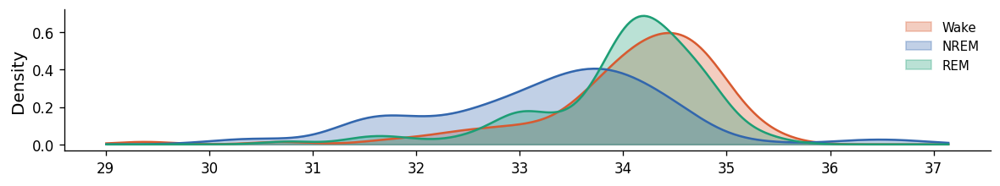

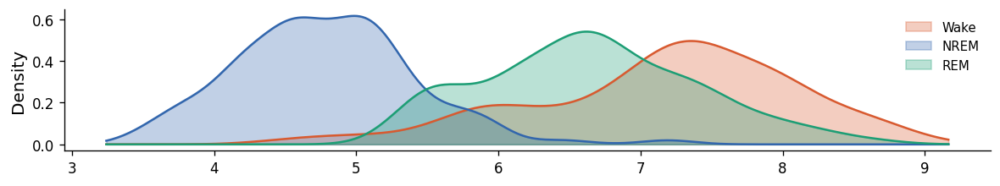

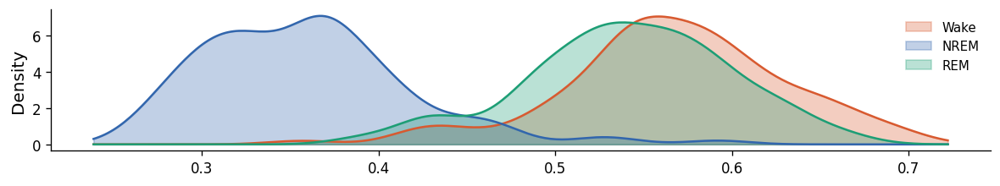

In [31]:
# ── Feature distributions by sleep state ──
from scipy.stats import gaussian_kde

state_names = ['Wake', 'NREM', 'REM']
colors_list = ['#D85A30', '#3266ad', '#1D9E75']

# --- Radii features: R1, R2, minor_radius (separate plots) ---
radii_names = [r'$R_1$', r'$R_2$', r'$r$ (minor)']
for col_idx, name in zip(radii_idx, radii_names):
    # Compute global x-range across all states with padding
    all_vals = torus_bal[:, col_idx]
    pad = 0.05 * (all_vals.max() - all_vals.min())
    xgrid = np.linspace(all_vals.min() - pad, all_vals.max() + pad, 300)

    fig, ax = plt.subplots(figsize=(10, 2))
    for s, sname, color in zip([0, 1, 2], state_names, colors_list):
        mask = labels_bal == s
        vals = torus_bal[mask, col_idx]
        kde = gaussian_kde(vals, bw_method=0.3)
        ax.fill_between(xgrid, kde(xgrid), alpha=0.3, color=color, label=sname)
        ax.plot(xgrid, kde(xgrid), color=color, lw=1.5)
    # ax.set_title(name, fontsize=12)
    ax.set_ylabel('Density')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(False)
    ax.legend(fontsize=9, frameon=False)
    plt.tight_layout()
    plt.show()

Wake: window 852  R1=35.56  R2=8.83  r=0.71  frac_in=0.04
NREM: window 1774  R1=31.65  R2=3.07  r=0.21  frac_in=0.01
REM: window 477  R1=34.54  R2=7.93  r=0.62  frac_in=0.04


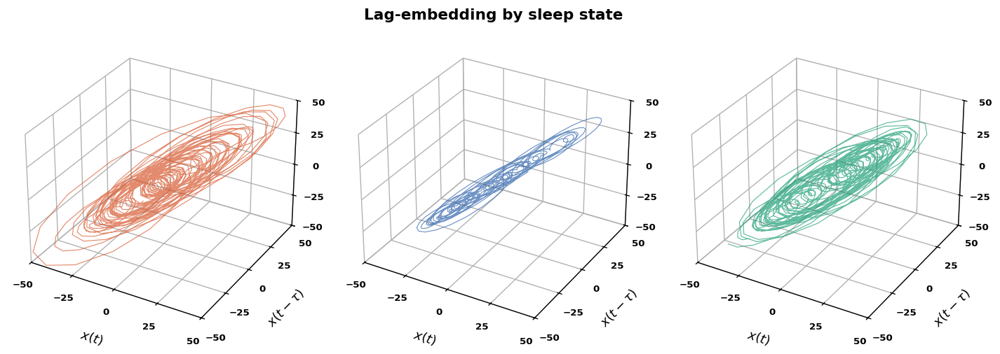

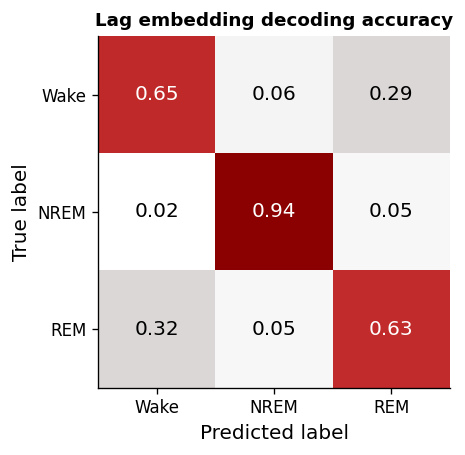

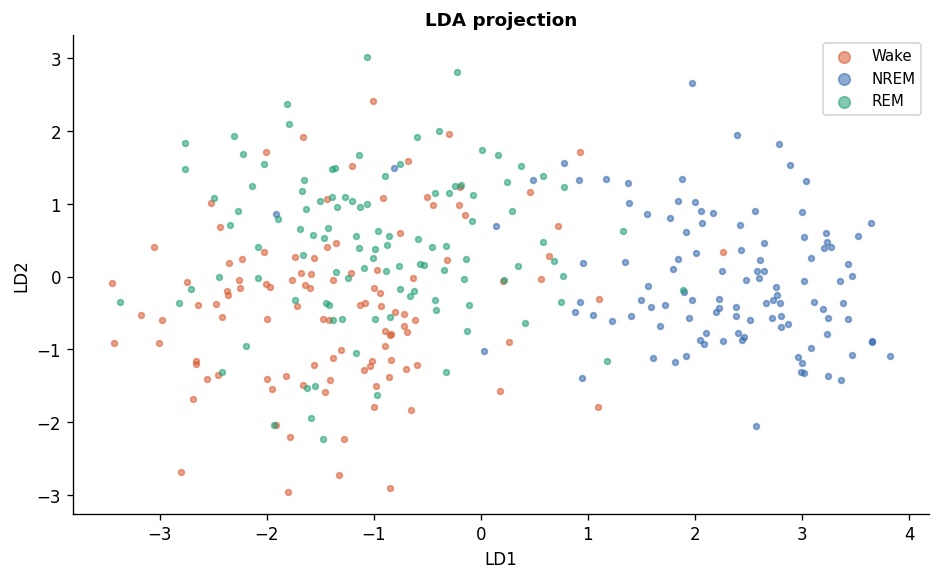

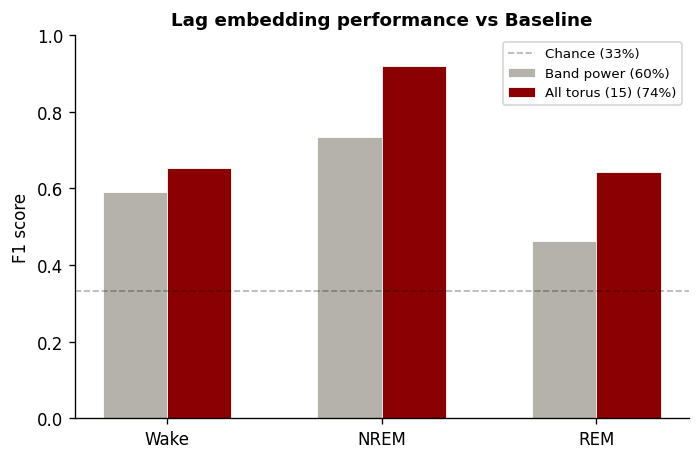

In [15]:
from matplotlib.ticker import MaxNLocator
from sklearn.preprocessing import StandardScaler

state_names = ['Wake', 'NREM', 'REM']
colors_list = ['#D85A30', '#3266ad', '#1D9E75']

cmap_cm = mcolors.LinearSegmentedColormap.from_list(
    "white_majority_darkred",
    [
        (0.0, "#ffffff"),
        (0.35, "#aca3a36c"),
        (0.60, "#c10404cf"),
        (1.0, "#8b0000ff")
    ]
)

# ── Pick maximally distinct representative windows using all 15 torus features ──
# Z-score normalize so every feature contributes equally
scaler = StandardScaler()
all_feat_z = scaler.fit_transform(all_torus_features)  # (n_windows, 15)

# Compute state centroids in normalized space
centroids = {}
for state in [0, 1, 2]:
    centroids[state] = all_feat_z[labels == state].mean(axis=0)

# For each state: score = closeness to own centroid − closeness to other centroids
# Pick the window that is most "prototypical" of its state and most unlike the others
rep_windows = {}
for state in [0, 1, 2]:
    state_mask = np.where(labels == state)[0]
    feats = all_feat_z[state_mask]
    
    # Distance to own centroid (want small)
    d_own = np.linalg.norm(feats - centroids[state], axis=1)
    # Distance to other centroids (want large)
    others = [c for s, c in centroids.items() if s != state]
    d_other = sum(np.linalg.norm(feats - c, axis=1) for c in others)
    
    # Score: maximize d_other - d_own  (typical of own state, unlike others)
    score = d_other - 2.0 * d_own
    best_local = np.argmax(score)
    rep_windows[state] = state_mask[best_local]

for state, wi in rep_windows.items():
    f = fits[wi]
    print(f"{state_names[state]}: window {wi}  R1={f['R1']:.2f}  R2={f['R2']:.2f}  "
          f"r={f['minor_radius']:.2f}  frac_in={f['frac_inside']:.2f}")

# ── Panel a: 3D lag-embedding trajectories ──
fig = plt.figure(figsize=(12, 8))
fig.suptitle('Lag-embedding by sleep state', fontsize=13, fontweight='bold', y=0.92)
axis_range = (-50, 50)
for i, (state, name, color) in enumerate(zip([0,1,2], state_names, colors_list)):
    ax = fig.add_subplot(1, 3, i+1, projection='3d')
    idx = rep_windows[state]
    X3 = embed(eeg_windows[idx][:800], dim, tau)
    ax.plot(X3[:,0], X3[:,1], X3[:,2], lw=0.7, alpha=0.7, color=color)
    ax.set_xlabel(r'$x(t)$', labelpad=8, fontsize=11)
    ax.set_ylabel(f'$x(t-\\tau)$', labelpad=8, fontsize=11)
    ax.set_zlabel(f"$x(t-2\\tau)$", labelpad=12, fontsize=11)
    ax.set_xlim(axis_range)
    ax.set_ylim(axis_range)
    ax.set_zlim(axis_range)
    ax.xaxis.set_major_locator(MaxNLocator(nbins=4))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=4))
    ax.zaxis.set_major_locator(MaxNLocator(nbins=4))
    ax.tick_params(axis='both', pad=3, labelsize=8)
    for lbl in ax.xaxis.get_ticklabels() + ax.yaxis.get_ticklabels() + ax.zaxis.get_ticklabels():
        lbl.set_fontweight('bold')
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
fig.subplots_adjust(left=0.02, right=0.98, top=1.2, wspace=0.1)
# plt.savefig('panel_a_trajectories.pdf', bbox_inches='tight', dpi=300)
plt.show()

# ── Panel b: Confusion matrix (all torus 15) ──
fig, ax_cm = plt.subplots(figsize=(4, 4))
cm = confusion_matrix(labels_bal, pred_all_bal, normalize='true')
disp = ConfusionMatrixDisplay(cm, display_labels=state_names)
disp.plot(ax=ax_cm, cmap=cmap_cm, values_format='.2f', colorbar=False)
for txt in disp.text_.ravel():
    r_, g_, b_, _ = mcolors.to_rgba(txt.get_color())
    if not (r_ > 0.95 and g_ > 0.95 and b_ > 0.95):
        txt.set_color('black')
ax_cm.grid(False)
ax_cm.set_title(f'Lag embedding decoding accuracy', fontsize=11, fontweight='bold')
plt.tight_layout()
# plt.savefig('panel_b_confusion.pdf', bbox_inches='tight', dpi=300)
plt.show()

# ── Panel c: LDA projection (all torus 15) ──
fig, ax_lda = plt.subplots(figsize=(8, 5))
lda_proj = LinearDiscriminantAnalysis()
X_lda = lda_proj.fit_transform(all_torus_bal, labels_bal)
for label, name, color in zip([0,1,2], state_names, colors_list):
    mask = labels_bal == label
    ax_lda.scatter(X_lda[mask,0], X_lda[mask,1], c=color, label=name, s=12, alpha=0.55)
ax_lda.set_xlabel('LD1', fontsize=10)
ax_lda.set_ylabel('LD2', fontsize=10)
ax_lda.legend(fontsize=9, markerscale=2)
ax_lda.spines['top'].set_visible(False)
ax_lda.spines['right'].set_visible(False)
ax_lda.set_title('LDA projection', fontsize=11, fontweight='bold')
ax_lda.grid(False)
plt.tight_layout()
# plt.savefig('panel_c_lda.pdf', bbox_inches='tight', dpi=300)
plt.show()

# ── Panel d: F1 bar chart (all 7 feature sets) ──
from sklearn.metrics import f1_score

all_preds_d = [
    pred_band_bal, 
    # pred_embed_bal, 
    # pred_radii_bal, 
    # pred_orient_bal,
    # pred_torus_bal, 
    pred_all_bal, 
    # pred_combined_bal,
]
all_accs_d = [
    acc_band_bal, 
    # acc_embed_bal, 
    # acc_radii_bal, 
    # acc_orient_bal,
    # acc_torus_bal, 
    acc_all_bal, 
    # acc_combined_bal,
]
all_labels_d = [
    'Band power', 
    # 'Lag embed', 
    # 'Radii', 
    # 'Orientation',
    # 'Torus (6)', 
    'All torus (15)', 
    # 'Torus + embed',
]
bar_colors = ['#B4B2A9', '#8b0000ff',
            #   '#D85A30', '#3266ad','#1D9E75', '#6A0DAD', '#E8A317'
            ]

f1_all = [f1_score(labels_bal, p, average=None) for p in all_preds_d]

n_sets = len(all_preds_d)
n_states = 3
x = np.arange(n_states)
total_w = 0.6
w = total_w / n_sets

fig, ax_bar = plt.subplots(figsize=(6, 4))
for i, (f1, lbl, acc, col) in enumerate(zip(f1_all, all_labels_d, all_accs_d, bar_colors)):
    offset = (i - n_sets / 2 + 0.5) * w
    ax_bar.bar(x + offset, f1, w, label=f'{lbl} ({acc:.0%})', color=col, edgecolor='white', linewidth=0.5)

ax_bar.axhline(1/3, ls='--', color='black', alpha=0.3, lw=1, label='Chance (33%)')
ax_bar.set_xticks(x)
ax_bar.set_xticklabels(state_names, fontsize=10)
ax_bar.set_ylabel('F1 score', fontsize=10)
ax_bar.set_ylim(0, 1)
ax_bar.legend(fontsize=8, loc='upper right')
ax_bar.spines['top'].set_visible(False)
ax_bar.spines['right'].set_visible(False)
ax_bar.set_title('Lag embedding performance vs Baseline', fontsize=11, fontweight='bold')
ax_bar.grid(False)
plt.tight_layout()
# plt.savefig('panel_d_f1_all.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [16]:
rep_windows

{0: np.int64(852), 1: np.int64(1774), 2: np.int64(477)}

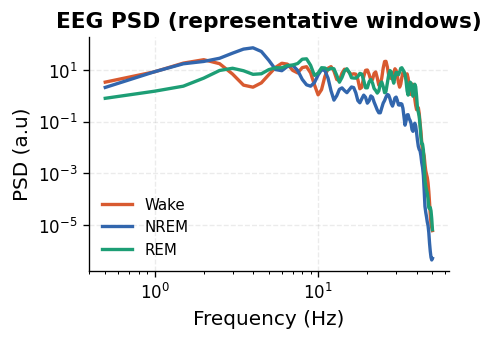

In [17]:
# ── PSD of representative windows ──
from scipy.ndimage import gaussian_filter1d

fig, ax = plt.subplots(figsize=(4, 3))

for s, sname, color in zip([0, 1, 2], state_names, colors_list):
    wi = rep_windows[s]
    f_psd, p = welch(eeg_windows[wi], fs=fs, nperseg=min(1024, win_samples), noverlap=512)
    psd_smooth = gaussian_filter1d(p, sigma=1)

    freq_mask = (f_psd >= 0.5) & (f_psd <= 50)
    ax.loglog(f_psd[freq_mask], psd_smooth[freq_mask], color=color, lw=2, label=sname)

ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("PSD (a.u)")
ax.set_title("EEG PSD (representative windows)", fontweight='bold')
ax.legend(fontsize=9, frameon=False)
ax.grid(True, ls="--", alpha=0.25)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.show()

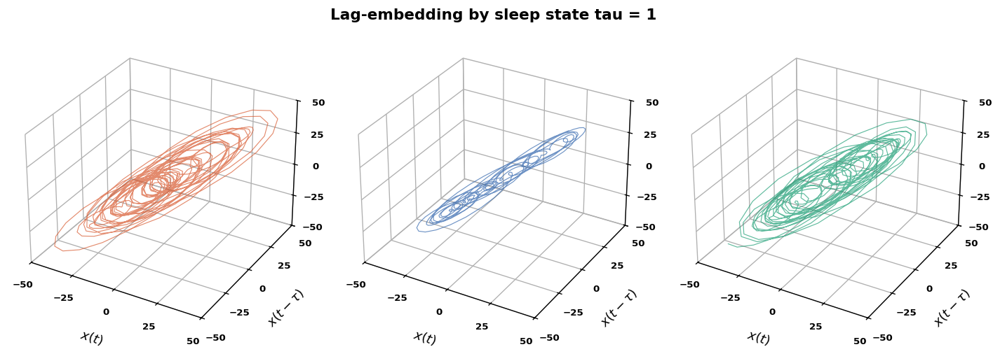

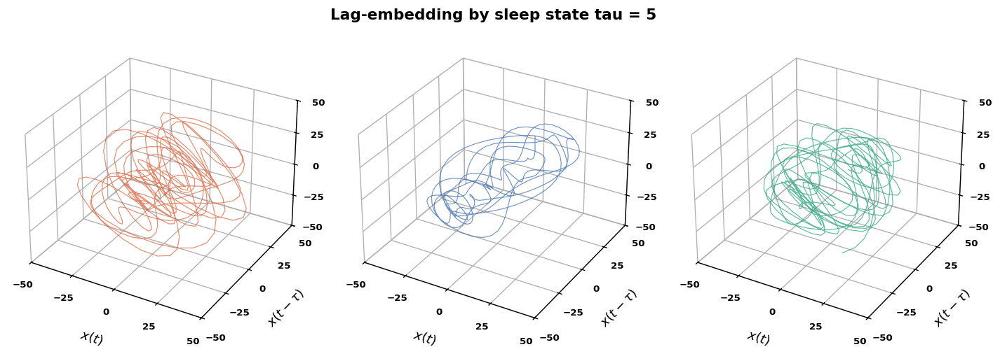

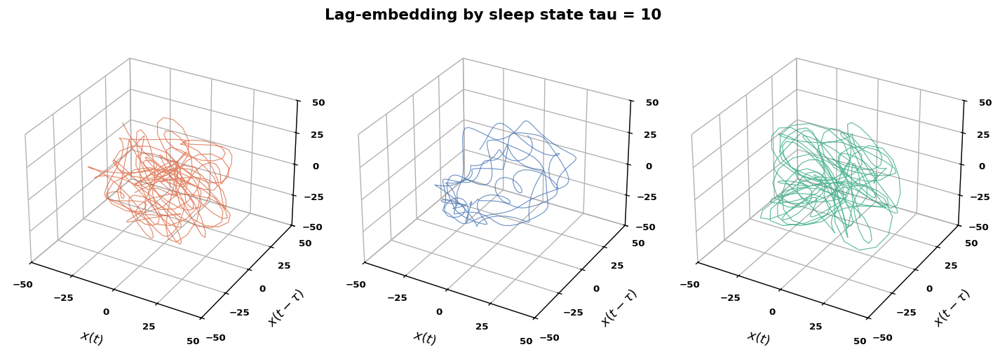

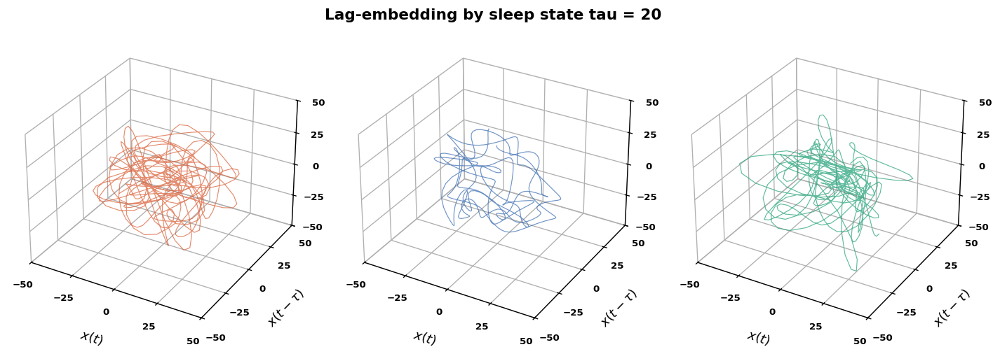

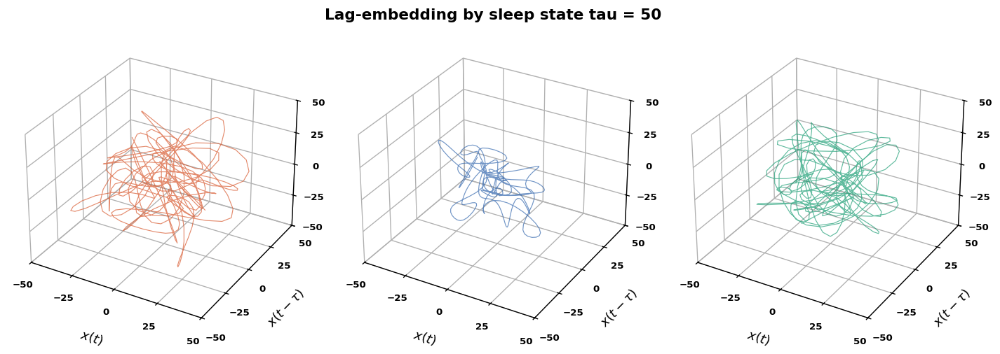

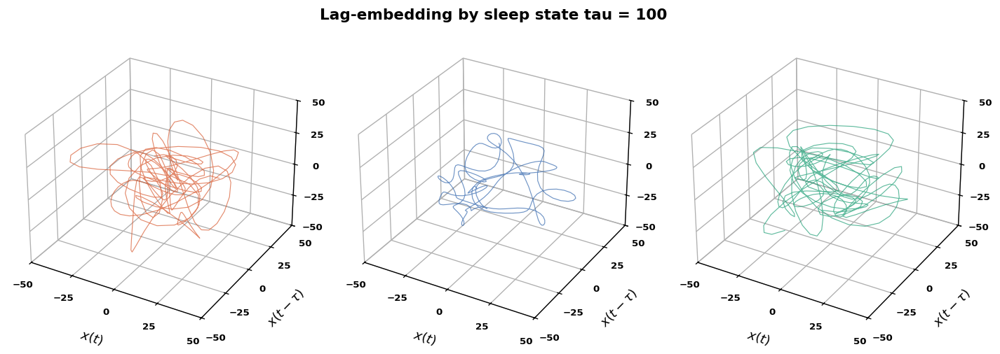

In [18]:
for tau in [1, 5, 10, 20, 50, 100]:
    dim=3
    # ── Panel a: 3D lag-embedding trajectories ──
    fig = plt.figure(figsize=(12, 8))
    fig.suptitle(f'Lag-embedding by sleep state tau = {tau}', fontsize=13, fontweight='bold', y=0.92)
    axis_range = (-50, 50)
    for i, (state, name, color) in enumerate(zip([0,1,2], state_names, colors_list)):
        ax = fig.add_subplot(1, 3, i+1, projection='3d')
        idx = rep_windows[state]
        X3 = embed(eeg_windows[idx][:500], dim, tau)
        ax.plot(X3[:,0], X3[:,1], X3[:,2], lw=0.7, alpha=0.7, color=color)
        ax.set_xlabel(r'$x(t)$', labelpad=8, fontsize=11)
        ax.set_ylabel(f'$x(t-\\tau)$', labelpad=8, fontsize=11)
        ax.set_zlabel(f"$x(t-2\\tau)$", labelpad=12, fontsize=11)
        ax.set_xlim(axis_range)
        ax.set_ylim(axis_range)
        ax.set_zlim(axis_range)
        ax.xaxis.set_major_locator(MaxNLocator(nbins=4))
        ax.yaxis.set_major_locator(MaxNLocator(nbins=4))
        ax.zaxis.set_major_locator(MaxNLocator(nbins=4))
        ax.tick_params(axis='both', pad=3, labelsize=8)
        for lbl in ax.xaxis.get_ticklabels() + ax.yaxis.get_ticklabels() + ax.zaxis.get_ticklabels():
            lbl.set_fontweight('bold')
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
    fig.subplots_adjust(left=0.02, right=0.98, top=1.2, wspace=0.1)
    # plt.savefig('panel_a_trajectories.pdf', bbox_inches='tight', dpi=300)
    plt.show()

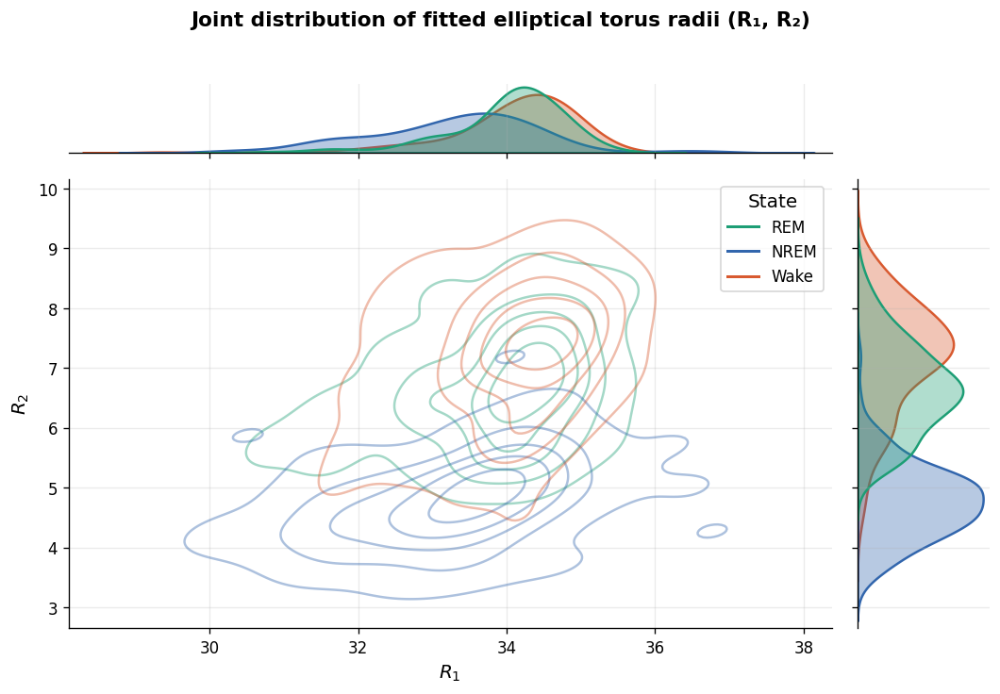

In [19]:
import seaborn as sns
import pandas as pd

r1_col = torus_keys.index('R1')
r2_col = torus_keys.index('R2')

df_joint = pd.DataFrame({
    'R1': torus_features[idx_balanced, r1_col],
    'R2': torus_features[idx_balanced, r2_col],
    'State': [state_names[int(s)] for s in labels_bal],
})

palette = {'Wake': '#D85A30', 'NREM': '#3266ad', 'REM': '#1D9E75'}

g = sns.jointplot(
    data=df_joint, x='R1', y='R2', hue='State',
    palette=palette, kind='kde', fill=False, alpha=0.4,
    marginal_kws=dict(fill=True, alpha=0.35, linewidth=1.5),
    joint_kws=dict(levels=6, linewidths=1.5),
    height=6,
)
g.ax_joint.set_xlabel(r'$R_1$', fontsize=12)
g.ax_joint.set_ylabel(r'$R_2$', fontsize=12)
g.figure.set_size_inches(9, 6)
g.figure.suptitle('Joint distribution of fitted elliptical torus radii (R₁, R₂)',
                   fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

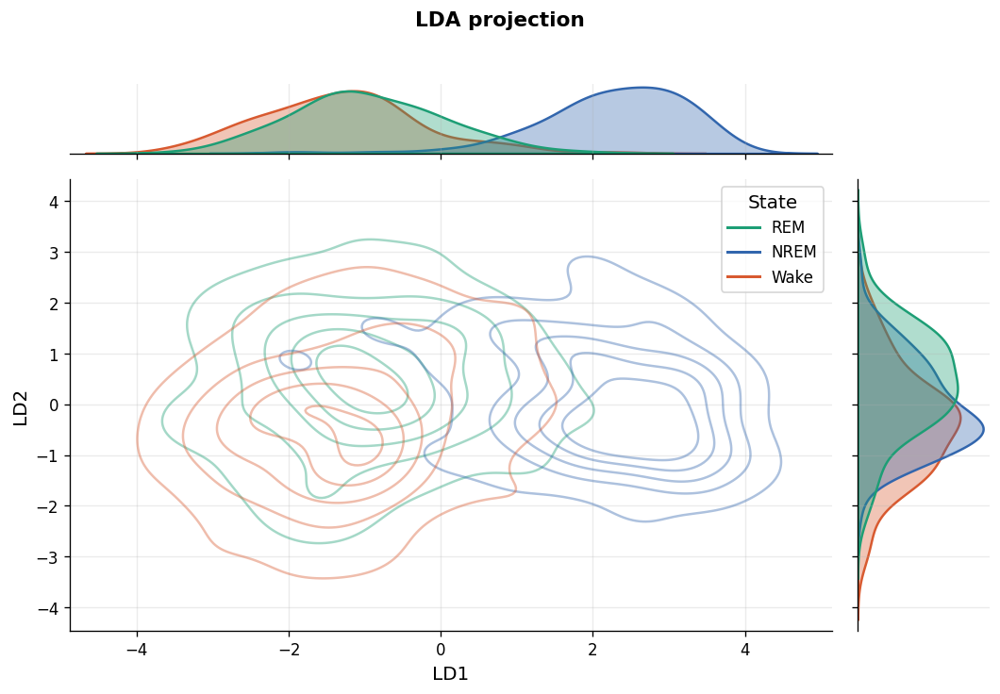

In [20]:
import seaborn as sns
import pandas as pd

# LDA projection of all 15 torus features
lda_joint = LinearDiscriminantAnalysis()
X_lda_joint = lda_joint.fit_transform(all_torus_bal, labels_bal)

df_lda = pd.DataFrame({
    'LD1': X_lda_joint[:, 0],
    'LD2': X_lda_joint[:, 1],
    'State': [state_names[int(s)] for s in labels_bal],
})

palette = {'Wake': '#D85A30', 'NREM': '#3266ad', 'REM': '#1D9E75'}

g = sns.jointplot(
    data=df_lda, x='LD1', y='LD2', hue='State',
    palette=palette, kind='kde', fill=False, alpha=0.4,
    marginal_kws=dict(fill=True, alpha=0.35, linewidth=1.5),
    joint_kws=dict(levels=6, alpha=0.8, linewidths=1.5),
    height=6,
)
g.figure.set_size_inches(9, 6)
g.ax_joint.set_xlabel('LD1', fontsize=12)
g.ax_joint.set_ylabel('LD2', fontsize=12)
g.figure.suptitle('LDA projection',
                   fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [21]:
np.where(labels == 0)[0].shape

(278,)

In [22]:
eeg_windows[827].shape

(800,)

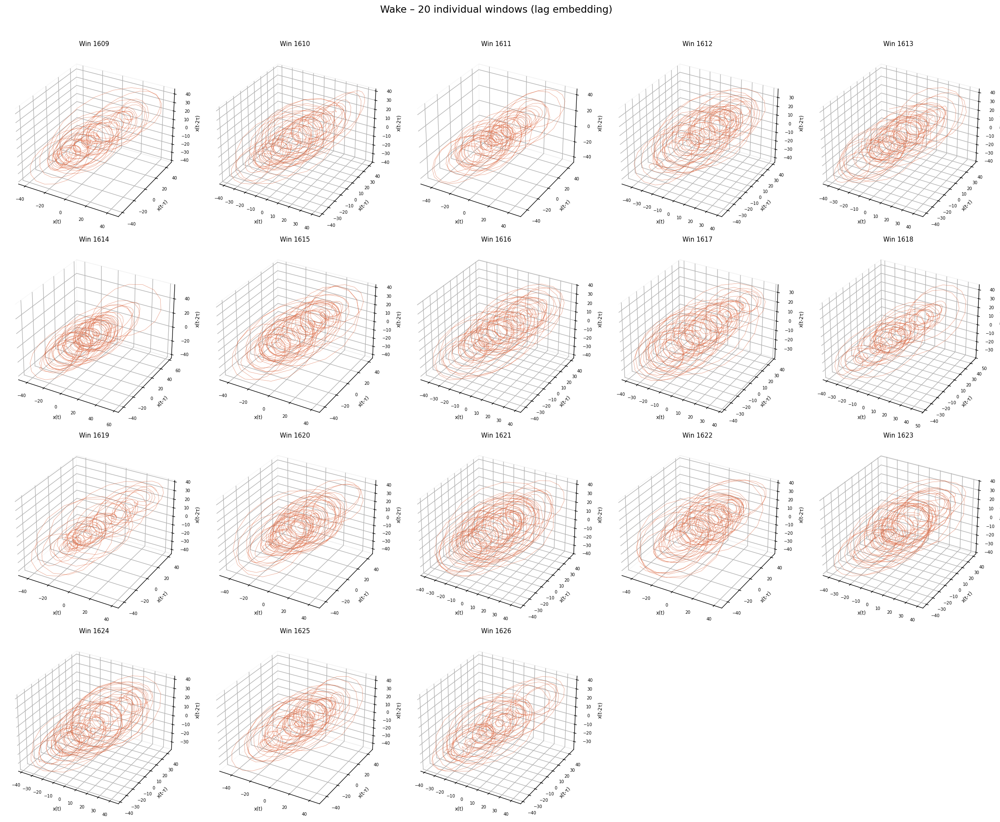

In [23]:
# 20 Wake windows – individual 3D subplots
wake_idxs = np.where(labels == 0)[0][260:280]
dim = 3
tau = 2
fig = plt.figure(figsize=(20, 16))

for i, wi in enumerate(wake_idxs):
    X3 = embed(eeg_windows[wi], dim, tau)
    ax = fig.add_subplot(4, 5, i + 1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2],
            lw=0.4, alpha=0.7, color='#D85A30')
    ax.set_title(f'Win {wi}', fontsize=9)
    ax.set_xlabel('x(t)', fontsize=7, labelpad=1)
    ax.set_ylabel('x(t-τ)', fontsize=7, labelpad=1)
    ax.set_zlabel('x(t-2τ)', fontsize=7, labelpad=1)
    ax.tick_params(labelsize=6)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

plt.suptitle('Wake – 20 individual windows (lag embedding)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


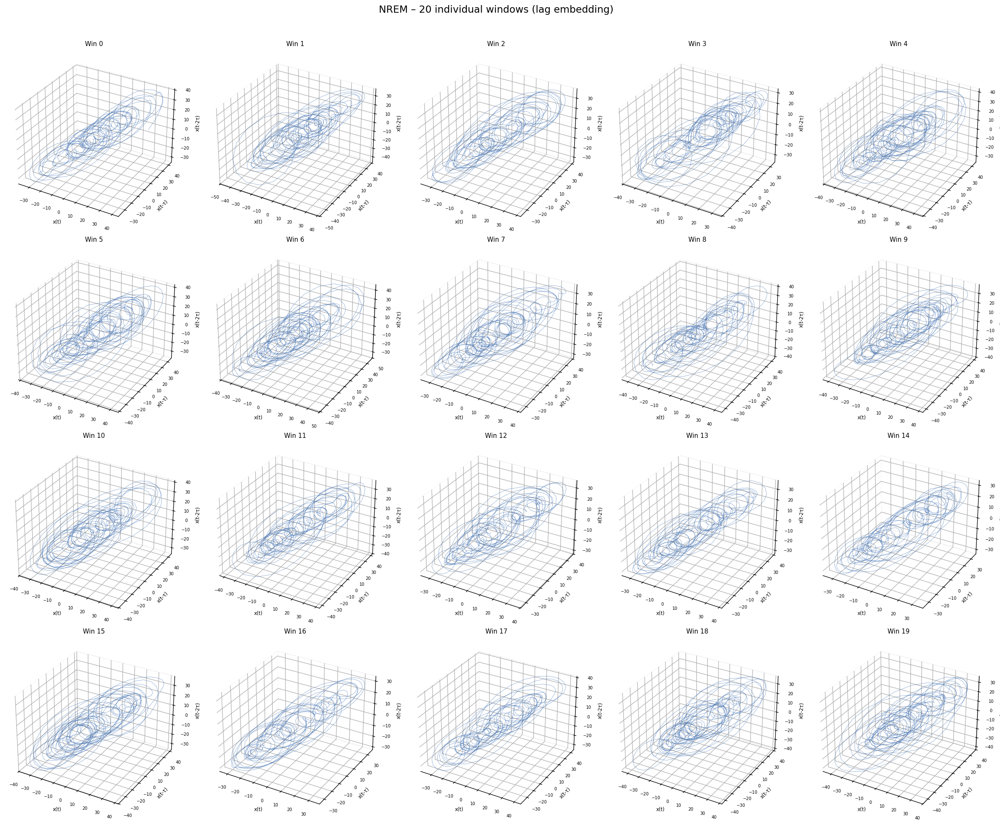

In [24]:
# 20 NREM windows – individual 3D subplots
nrem_idxs = np.where(labels == 1)[0][:20]
dim = 3
tau = 2
fig = plt.figure(figsize=(20, 16))

for i, wi in enumerate(nrem_idxs):
    X3 = embed(eeg_windows[wi], dim, tau)
    ax = fig.add_subplot(4, 5, i + 1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2],
            lw=0.4, alpha=0.7, color='#3266ad')
    ax.set_title(f'Win {wi}', fontsize=9)
    ax.set_xlabel('x(t)', fontsize=7, labelpad=1)
    ax.set_ylabel('x(t-τ)', fontsize=7, labelpad=1)
    ax.set_zlabel('x(t-2τ)', fontsize=7, labelpad=1)
    ax.tick_params(labelsize=6)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

plt.suptitle('NREM – 20 individual windows (lag embedding)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


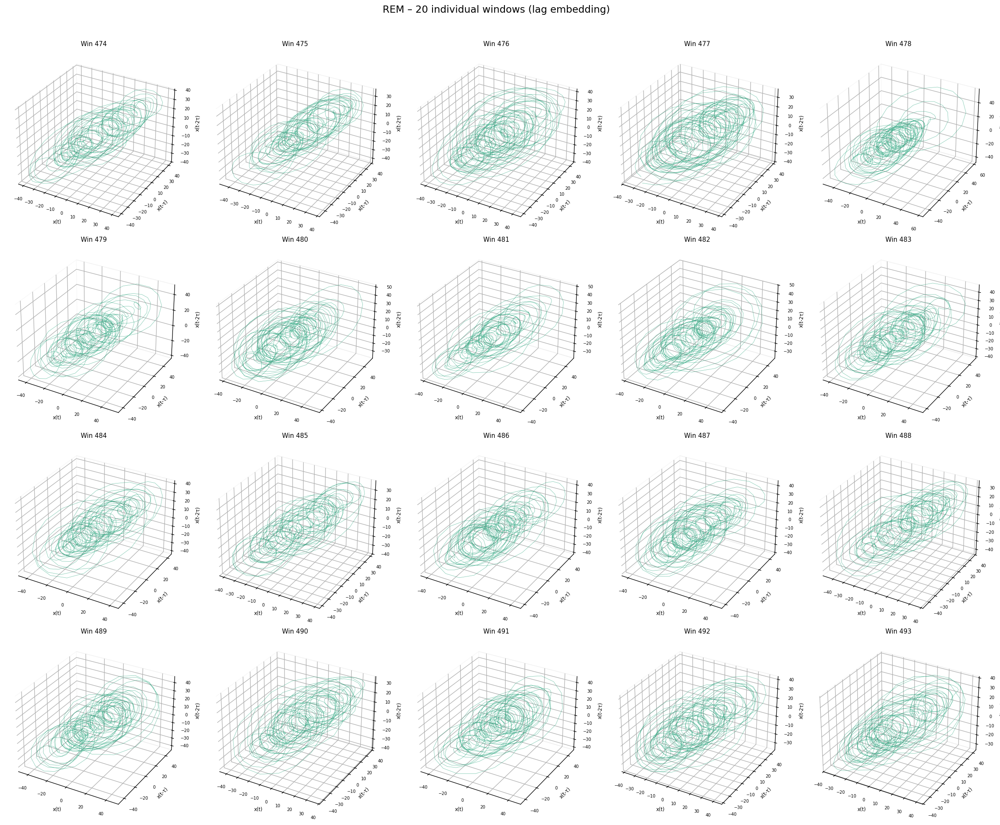

In [25]:
# 20 REM windows – individual 3D subplots
rem_idxs = np.where(labels == 2)[0][:20]
dim = 3
tau = 2
fig = plt.figure(figsize=(20, 16))

for i, wi in enumerate(rem_idxs):
    X3 = embed(eeg_windows[wi], dim, tau)
    ax = fig.add_subplot(4, 5, i + 1, projection='3d')
    ax.plot(X3[:, 0], X3[:, 1], X3[:, 2],
            lw=0.4, alpha=0.7, color='#1D9E75')
    ax.set_title(f'Win {wi}', fontsize=9)
    ax.set_xlabel('x(t)', fontsize=7, labelpad=1)
    ax.set_ylabel('x(t-τ)', fontsize=7, labelpad=1)
    ax.set_zlabel('x(t-2τ)', fontsize=7, labelpad=1)
    ax.tick_params(labelsize=6)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

plt.suptitle('REM – 20 individual windows (lag embedding)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()
